# EDA FOR ANNOTATED IMAGES

In [2]:
# Import Required Libraries
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from pathlib import Path
from collections import Counter, defaultdict
from typing import Dict, List, Tuple

# Set visualization style
sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["font.size"] = 10

# Define project paths
PROJECT_ROOT = (
    Path(__file__).parent.parent if "__file__" in locals() else Path.cwd().parent
)
DATA_ROOT = PROJECT_ROOT / "data"
ANNOTATIONS_PATH = DATA_ROOT / "annotations" / "annotations-coco-1.0.json"
RAW_DATA_PATH = DATA_ROOT / "raw"

print(f"✅ Project Root: {PROJECT_ROOT}")
print(f"✅ Annotations Path: {ANNOTATIONS_PATH}")
print(f"✅ Raw Data Path: {RAW_DATA_PATH}")

✅ Project Root: e:\container-id-research
✅ Annotations Path: e:\container-id-research\data\annotations\annotations-coco-1.0.json
✅ Raw Data Path: e:\container-id-research\data\raw


## 1. LOAD & PARSE DATA

Đọc file annotations COCO và chuyển đổi sang dạng DataFrame để dễ dàng phân tích.

In [3]:
# Load COCO annotations
with open(ANNOTATIONS_PATH, "r") as f:
    coco_data = json.load(f)

# Extract basic statistics
n_images = len(coco_data["images"])
n_annotations = len(coco_data["annotations"])
n_categories = len(coco_data["categories"])

print("=" * 60)
print("📊 DATASET OVERVIEW")
print("=" * 60)
print(f"📸 Total Images: {n_images}")
print(f"🏷️  Total Annotations: {n_annotations}")
print(f"📦 Categories: {n_categories}")
print()

# Display categories
print("Categories:")
for cat in coco_data["categories"]:
    print(f"  - ID {cat['id']}: {cat['name']}")

# Count annotations per category
cat_counts = Counter([ann["category_id"] for ann in coco_data["annotations"]])
print("\nAnnotations per category:")
for cat_id, count in cat_counts.items():
    cat_name = next(c["name"] for c in coco_data["categories"] if c["id"] == cat_id)
    print(f"  - {cat_name}: {count}")

print("=" * 60)

📊 DATASET OVERVIEW
📸 Total Images: 831
🏷️  Total Annotations: 989
📦 Categories: 2

Categories:
  - ID 1: container_door
  - ID 2: container_id

Annotations per category:
  - container_id: 489
  - container_door: 500


In [4]:
# Create DataFrame from annotations
# We need to combine attributes from both container_door and container_id annotations

# First, get door annotations (category_id=1) with their attributes
door_annotations = [ann for ann in coco_data["annotations"] if ann["category_id"] == 1]

# Parse door attributes into a flat structure
parsed_data = []
for ann in door_annotations:
    row = {
        "annotation_id": ann["id"],
        "image_id": ann["image_id"],
        "bbox_area": ann["area"],
    }
    # Flatten attributes from door
    if "attributes" in ann:
        for key, value in ann["attributes"].items():
            # Convert boolean to string for consistency
            if isinstance(value, bool):
                value = "occluded" if key == "occluded" and value else "not_occluded"
            row[key] = value
    parsed_data.append(row)

# Now get container_id annotations (category_id=2) to extract ocr_feasibility
id_annotations = [ann for ann in coco_data["annotations"] if ann["category_id"] == 2]

# Create a mapping: image_id -> ocr_feasibility
ocr_feasibility_map = {}
for ann in id_annotations:
    image_id = ann["image_id"]
    ocr_feasibility = ann.get("attributes", {}).get("ocr_feasibility")
    if ocr_feasibility:
        ocr_feasibility_map[image_id] = ocr_feasibility

# Add ocr_feasibility to parsed_data
for row in parsed_data:
    image_id = row["image_id"]
    if image_id in ocr_feasibility_map:
        row["ocr_feasibility"] = ocr_feasibility_map[image_id]
    else:
        row["ocr_feasibility"] = "unknown"

df = pd.DataFrame(parsed_data)

# Display basic info
print(f"\n📋 DataFrame Shape: {df.shape}")
print(f"\n🔍 Columns: {list(df.columns)}")
print(f"\n📝 Sample Data:")
df.head()


📋 DataFrame Shape: (500, 13)

🔍 Columns: ['annotation_id', 'image_id', 'bbox_area', 'view_angle', 'lightning', 'door_state', 'occlusion', 'surface', 'sharpness', 'quality_gate', 'occluded', 'rotation', 'ocr_feasibility']

📝 Sample Data:


,annotation_id,image_id,bbox_area,view_angle,lightning,door_state,occlusion,surface,sharpness,quality_gate,occluded,rotation,ocr_feasibility
0,2,1,1.773567e+06,angled,good_light,closed,not_occluded,clean,sharp,pass,not_occluded,0.0,readable
1,3,2,1.797017e+06,angled,good_light,closed,not_occluded,clean,sharp,pass,not_occluded,0.0,readable
2,5,3,2.248052e+06,angled,good_light,closed,not_occluded,clean,sharp,pass,not_occluded,0.0,readable
3,7,4,2.009619e+06,angled,good_light,closed,not_occluded,not_clean,sharp,pass,not_occluded,0.0,readable
4,9,5,8.965827e+05,angled,good_light,closed,not_occluded,clean,sharp,pass,not_occluded,0.0,readable


## 2. TẦNG 1: THỐNG KÊ ĐỔN BIẾN (Univariate Analysis)

Phân tích từng yếu tố riêng lẻ để hiểu phân phối dữ liệu và phát hiện mất cân bằng.

C:\Users\USER\AppData\Local\Temp\ipykernel_18932\2594224924.py:84: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout(rect=[0, 0, 1, 0.99])
e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


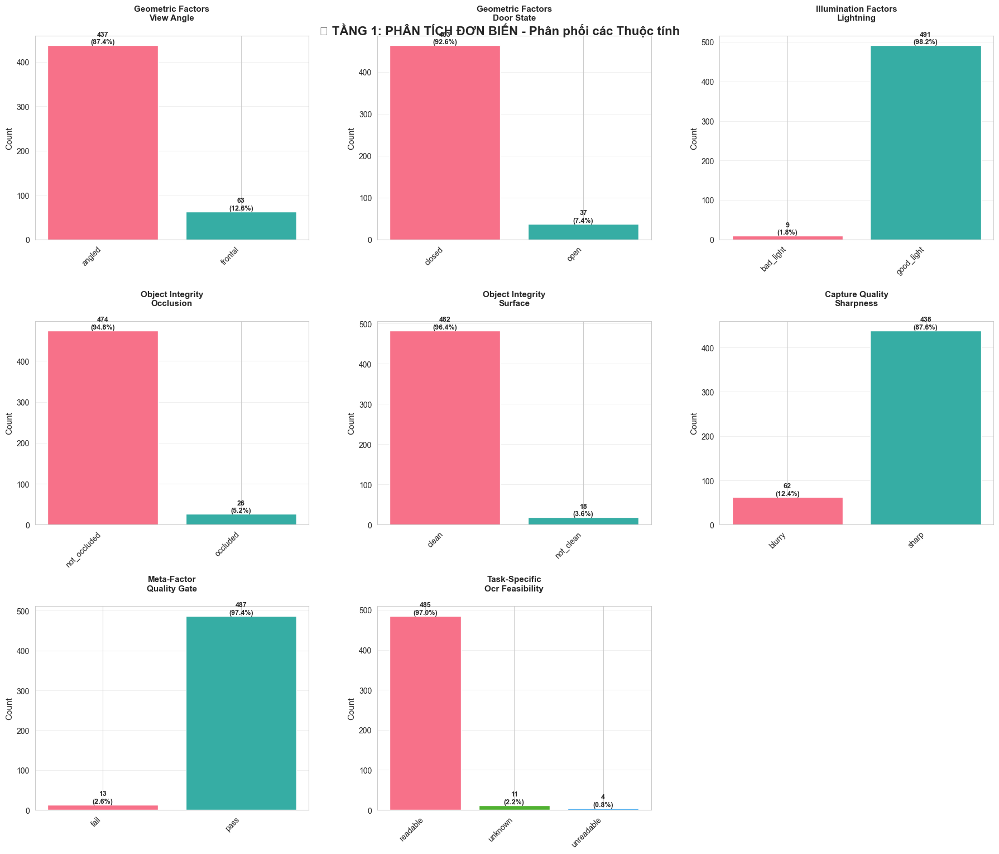


📈 SUMMARY: DATA IMBALANCE ANALYSIS

🔸 Geometric Factors:
   view_angle:
     ⚠️ angled: 437 (87.4%)
     ⚠️ frontal: 63 (12.6%)
   door_state:
     ⚠️ closed: 463 (92.6%)
     ⚠️ open: 37 (7.4%)

🔸 Illumination Factors:
   lightning:
     ⚠️ good_light: 491 (98.2%)
     ⚠️ bad_light: 9 (1.8%)

🔸 Object Integrity:
   occlusion:
     ⚠️ not_occluded: 474 (94.8%)
     ⚠️ occluded: 26 (5.2%)
   surface:
     ⚠️ clean: 482 (96.4%)
     ⚠️ not_clean: 18 (3.6%)

🔸 Capture Quality:
   sharpness:
     ⚠️ sharp: 438 (87.6%)
     ⚠️ blurry: 62 (12.4%)

🔸 Meta-Factor:
   quality_gate:
     ⚠️ pass: 487 (97.4%)
     ⚠️ fail: 13 (2.6%)

🔸 Task-Specific:
   ocr_feasibility:
     ⚠️ readable: 485 (97.0%)
     ⚠️ unknown: 11 (2.2%)
     ⚠️ unreadable: 4 (0.8%)


In [5]:
# Define attribute groups based on annotation guidelines
attribute_groups = {
    "Geometric Factors": ["view_angle", "door_state"],
    "Illumination Factors": [
        "lightning"
    ],  # Note: typo in original data (lightning vs lighting)
    "Object Integrity": ["occlusion", "surface"],
    "Capture Quality": ["sharpness"],
    "Meta-Factor": ["quality_gate"],
    "Task-Specific": ["ocr_feasibility"],  # From container_id annotations
}


# Count values for each attribute
def plot_univariate_analysis():
    """
    Vẽ biểu đồ cột cho từng nhóm thuộc tính
    """
    # Calculate number of attributes to plot
    n_attrs = sum(
        1 for attrs in attribute_groups.values() for attr in attrs if attr in df.columns
    )

    # Determine grid size dynamically
    n_cols = 3
    n_rows = (n_attrs + n_cols - 1) // n_cols  # Ceiling division

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
    axes = axes.flatten()

    plot_idx = 0

    for group_name, attributes in attribute_groups.items():
        for attr in attributes:
            if attr in df.columns:
                ax = axes[plot_idx]

                # Count values
                value_counts = df[attr].value_counts().sort_index()

                # Create bar chart
                colors = sns.color_palette("husl", len(value_counts))
                bars = ax.bar(
                    range(len(value_counts)), value_counts.values, color=colors
                )

                # Add value labels on bars
                for i, (bar, count) in enumerate(zip(bars, value_counts.values)):
                    height = bar.get_height()
                    ax.text(
                        bar.get_x() + bar.get_width() / 2.0,
                        height,
                        f"{int(count)}\n({count/len(df)*100:.1f}%)",
                        ha="center",
                        va="bottom",
                        fontsize=9,
                        fontweight="bold",
                    )

                # Styling
                ax.set_xticks(range(len(value_counts)))
                ax.set_xticklabels(value_counts.index, rotation=45, ha="right")
                ax.set_ylabel("Count", fontsize=11)
                ax.set_title(
                    f'{group_name}\n{attr.replace("_", " ").title()}',
                    fontsize=11,
                    fontweight="bold",
                    pad=20,
                )
                ax.grid(axis="y", alpha=0.3)

                plot_idx += 1

    # Hide unused subplots
    for idx in range(plot_idx, len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        "📊 TẦNG 1: PHÂN TÍCH ĐƠN BIẾN - Phân phối các Thuộc tính",
        fontsize=16,
        fontweight="bold",
        y=0.995,
    )
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.subplots_adjust(top=0.98, hspace=0.4, wspace=0.25)
    return fig


fig = plot_univariate_analysis()
plt.show()

# Print summary statistics
print("\n" + "=" * 70)
print("📈 SUMMARY: DATA IMBALANCE ANALYSIS")
print("=" * 70)
for group_name, attributes in attribute_groups.items():
    print(f"\n🔸 {group_name}:")
    for attr in attributes:
        if attr in df.columns:
            counts = df[attr].value_counts()
            total = len(df)
            print(f"   {attr}:")
            for val, count in counts.items():
                percentage = (count / total) * 100
                imbalance_indicator = (
                    "⚠️ " if percentage < 20 or percentage > 80 else "✓ "
                )
                print(f"     {imbalance_indicator}{val}: {count} ({percentage:.1f}%)")
print("=" * 70)

## 3. TẦNG 2: THỐNG KÊ ĐA BIẾN (Multivariate Analysis)

Phân tích mối quan hệ đồng xuất hiện giữa các thuộc tính để tìm ra "combo lỗi" khó nhằn nhất.

In [6]:
# Prepare data for co-occurrence matrix
# Extract all unique attribute values across all attributes
all_attribute_values = []
attribute_columns = []

for group_attrs in attribute_groups.values():
    for attr in group_attrs:
        if attr in df.columns:
            attribute_columns.append(attr)
            unique_vals = df[attr].unique()
            for val in unique_vals:
                all_attribute_values.append(f"{attr}:{val}")

print(f"Total unique attribute-value combinations: {len(all_attribute_values)}")
print(f"Attributes analyzed: {attribute_columns}")
print(f"\nSample combinations: {all_attribute_values[:5]}")

Total unique attribute-value combinations: 17
Attributes analyzed: ['view_angle', 'door_state', 'lightning', 'occlusion', 'surface', 'sharpness', 'quality_gate', 'ocr_feasibility']

Sample combinations: ['view_angle:angled', 'view_angle:frontal', 'door_state:closed', 'door_state:open', 'lightning:good_light']


In [7]:
# Build co-occurrence matrix
def build_cooccurrence_matrix(df, attributes):
    """
    Xây dựng ma trận đồng xuất hiện giữa các giá trị thuộc tính
    """
    # Get all attribute:value pairs
    attr_values = []
    for attr in attributes:
        if attr in df.columns:
            for val in df[attr].unique():
                attr_values.append((attr, val))

    n = len(attr_values)
    cooccur_matrix = np.zeros((n, n), dtype=int)

    # Count co-occurrences
    for idx, row in df.iterrows():
        for i, (attr1, val1) in enumerate(attr_values):
            if row.get(attr1) == val1:
                for j, (attr2, val2) in enumerate(attr_values):
                    if row.get(attr2) == val2:
                        cooccur_matrix[i, j] += 1

    # Create labels
    labels = [f"{attr.replace('_', ' ')}\n{val}" for attr, val in attr_values]

    return cooccur_matrix, labels, attr_values


# Build the matrix
cooccur_matrix, labels, attr_value_pairs = build_cooccurrence_matrix(
    df, attribute_columns
)

print(f"✅ Co-occurrence matrix built: {cooccur_matrix.shape}")
print(f"   Matrix size: {cooccur_matrix.shape[0]} x {cooccur_matrix.shape[1]}")

✅ Co-occurrence matrix built: (17, 17)
   Matrix size: 17 x 17


C:\Users\USER\AppData\Local\Temp\ipykernel_18932\2021143179.py:44: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) Arial.
  plt.tight_layout()
e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


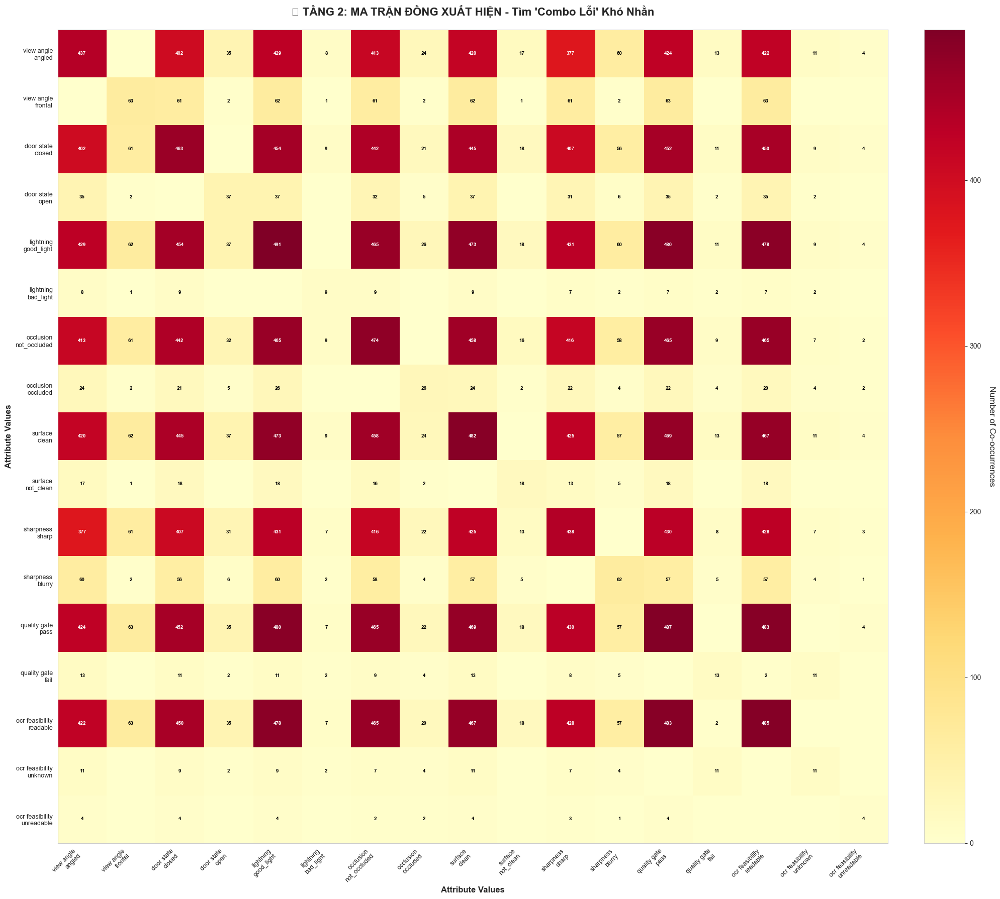

In [8]:
# Visualize co-occurrence matrix as heatmap
def plot_cooccurrence_heatmap(matrix, labels, title="Co-occurrence Heatmap"):
    """
    Vẽ biểu đồ nhiệt cho ma trận đồng xuất hiện
    """
    fig, ax = plt.subplots(figsize=(20, 18))

    # Create heatmap
    im = ax.imshow(matrix, cmap="YlOrRd", aspect="auto")

    # Set ticks and labels
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=9)
    ax.set_yticklabels(labels, fontsize=9)

    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Number of Co-occurrences", rotation=270, labelpad=20, fontsize=12)

    # Add text annotations
    for i in range(len(labels)):
        for j in range(len(labels)):
            if matrix[i, j] > 0:
                text_color = "white" if matrix[i, j] > matrix.max() * 0.6 else "black"
                text = ax.text(
                    j,
                    i,
                    matrix[i, j],
                    ha="center",
                    va="center",
                    color=text_color,
                    fontsize=7,
                    fontweight="bold",
                )

    ax.set_title(title, fontsize=16, fontweight="bold", pad=20)
    ax.set_xlabel("Attribute Values", fontsize=12, fontweight="bold")
    ax.set_ylabel("Attribute Values", fontsize=12, fontweight="bold")

    # Remove gridlines for better visibility of numbers
    ax.grid(False)

    plt.tight_layout()
    return fig


fig = plot_cooccurrence_heatmap(
    cooccur_matrix,
    labels,
    "🔥 TẦNG 2: MA TRẬN ĐỒNG XUẤT HIỆN - Tìm 'Combo Lỗi' Khó Nhằn",
)
plt.show()

In [13]:
# Identify and highlight the most challenging combinations
def find_hardest_negatives(df, top_n=10):
    """
    Tìm các tổ hợp thuộc tính khó nhằn nhất (hardest negatives)
    """
    # Define "bad" attributes (challenging conditions)
    bad_conditions = {
        "view_angle": "angled",
        "lightning": "bad_light",
        "occlusion": "occluded",
        "surface": "not_clean",
        "sharpness": "blurry",
        "quality_gate": "fail",
    }

    # Count combinations of bad attributes
    combinations = []

    for idx, row in df.iterrows():
        bad_attrs = []
        for attr, bad_val in bad_conditions.items():
            if attr in row and row[attr] == bad_val:
                bad_attrs.append(f"{attr}={bad_val}")

        if len(bad_attrs) >= 2:  # Only consider combinations of 2+ bad attributes
            combo = " + ".join(sorted(bad_attrs))
            combinations.append(
                {
                    "combination": combo,
                    "image_id": row["image_id"],
                    "n_bad_attrs": len(bad_attrs),
                }
            )

    # Count and sort
    combo_counts = Counter([c["combination"] for c in combinations])

    print("=" * 80)
    print("🔥 TOP HARDEST NEGATIVE COMBINATIONS (2+ Bad Attributes)")
    print("=" * 80)

    for i, (combo, count) in enumerate(combo_counts.most_common(top_n), 1):
        percentage = (count / len(df)) * 100
        print(f"{i:2d}. [{count:3d} images | {percentage:5.2f}%] {combo}")

    print("=" * 80)

    return combinations, combo_counts


combinations, combo_counts = find_hardest_negatives(df, top_n=15)

🔥 TOP HARDEST NEGATIVE COMBINATIONS (2+ Bad Attributes)
 1. [ 47 images |  9.40%] sharpness=blurry + view_angle=angled
 2. [ 16 images |  3.20%] occlusion=occluded + view_angle=angled
 3. [ 12 images |  2.40%] surface=not_clean + view_angle=angled
 4. [  5 images |  1.00%] lightning=bad_light + view_angle=angled
 5. [  4 images |  0.80%] occlusion=occluded + quality_gate=fail + view_angle=angled
 6. [  4 images |  0.80%] quality_gate=fail + sharpness=blurry + view_angle=angled
 7. [  3 images |  0.60%] quality_gate=fail + view_angle=angled
 8. [  3 images |  0.60%] sharpness=blurry + surface=not_clean + view_angle=angled
 9. [  2 images |  0.40%] occlusion=occluded + sharpness=blurry + view_angle=angled
10. [  2 images |  0.40%] occlusion=occluded + sharpness=blurry + surface=not_clean + view_angle=angled
11. [  1 images |  0.20%] lightning=bad_light + quality_gate=fail + view_angle=angled
12. [  1 images |  0.20%] lightning=bad_light + sharpness=blurry + view_angle=angled
13. [  1 ima

## 4. TẦNG 3: TRỰC QUAN HÓA DỮ LIỆU THỰC TẾ (Qualitative Visualization)

Hiển thị các ảnh mẫu với bounding boxes và annotations để minh họa chất lượng dữ liệu.

In [14]:
# Helper functions for visualization
def draw_annotations_on_image(img, annotations, categories):
    """
    Vẽ bounding boxes và polygons lên ảnh

    Args:
        img: numpy array của ảnh
        annotations: list các annotation cho ảnh này
        categories: dict mapping category_id -> category_name
    """
    img_annotated = img.copy()

    for ann in annotations:
        cat_id = ann["category_id"]
        cat_name = categories[cat_id]

        if cat_name == "container_door":
            # Draw bounding box for door (rectangle)
            bbox = ann["bbox"]
            x, y, w, h = [int(v) for v in bbox]
            cv2.rectangle(img_annotated, (x, y), (x + w, y + h), (0, 255, 0), 3)
            cv2.putText(
                img_annotated,
                "DOOR",
                (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.7,
                (0, 255, 0),
                2,
            )

        elif cat_name == "container_id":
            # Draw polygon for ID region
            if ann["segmentation"] and len(ann["segmentation"]) > 0:
                seg = ann["segmentation"][0]
                points = np.array(seg).reshape(-1, 2).astype(np.int32)
                cv2.polylines(img_annotated, [points], True, (255, 0, 0), 3)

                # Draw points
                for i, (px, py) in enumerate(points):
                    cv2.circle(img_annotated, (int(px), int(py)), 5, (0, 0, 255), -1)
                    cv2.putText(
                        img_annotated,
                        str(i + 1),
                        (int(px) + 10, int(py) + 10),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.5,
                        (0, 0, 255),
                        2,
                    )

                # Label
                centroid_x = int(np.mean(points[:, 0]))
                centroid_y = int(np.mean(points[:, 1]))
                cv2.putText(
                    img_annotated,
                    "ID",
                    (centroid_x, centroid_y),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.7,
                    (255, 0, 0),
                    2,
                )

    return img_annotated


def load_and_annotate_image(image_info, all_annotations, categories, data_path):
    """
    Load ảnh và vẽ annotations lên đó
    """
    img_path = data_path / image_info["file_name"]

    if not img_path.exists():
        print(f"⚠️  Image not found: {img_path}")
        return None

    # Load image
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"⚠️  Failed to load: {img_path}")
        return None

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get annotations for this image
    img_annotations = [
        ann for ann in all_annotations if ann["image_id"] == image_info["id"]
    ]

    # Draw annotations
    img_annotated = draw_annotations_on_image(img, img_annotations, categories)

    return img_annotated


# Create category mapping
category_map = {cat["id"]: cat["name"] for cat in coco_data["categories"]}

print("✅ Visualization helper functions ready")
print(f"   Categories: {category_map}")

✅ Visualization helper functions ready
   Categories: {1: 'container_door', 2: 'container_id'}


In [15]:
# Create image grid function
def create_image_grid(images, titles, grid_size=(4, 4), figsize=(20, 20)):
    """
    Tạo lưới hiển thị nhiều ảnh

    Args:
        images: list các numpy array ảnh
        titles: list các tiêu đề tương ứng
        grid_size: tuple (rows, cols)
        figsize: tuple kích thước figure
    """
    rows, cols = grid_size
    n_images = min(len(images), rows * cols)

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten() if rows * cols > 1 else [axes]

    for idx in range(n_images):
        ax = axes[idx]
        ax.imshow(images[idx])
        ax.set_title(titles[idx], fontsize=10, fontweight="bold", pad=5)
        ax.axis("off")

    # Hide unused subplots
    for idx in range(n_images, len(axes)):
        axes[idx].axis("off")

    plt.tight_layout()
    return fig


def filter_and_sample_images(df, coco_data, conditions, n_samples=16, random_seed=42):
    """
    Lọc và lấy mẫu ảnh theo điều kiện

    Args:
        df: DataFrame chứa annotations
        coco_data: dict COCO data
        conditions: dict các điều kiện lọc {attribute: value}
        n_samples: số lượng mẫu cần lấy
        random_seed: seed cho random sampling
    """
    # Filter by conditions
    filtered_df = df.copy()
    for attr, value in conditions.items():
        if attr in filtered_df.columns:
            filtered_df = filtered_df[filtered_df[attr] == value]

    print(f"   Filtered: {len(filtered_df)} images match conditions {conditions}")

    # Sample
    n_samples = min(n_samples, len(filtered_df))
    sampled_df = (
        filtered_df.sample(n=n_samples, random_state=random_seed)
        if n_samples > 0
        else filtered_df
    )

    # Get image info
    sampled_image_ids = sampled_df["image_id"].tolist()
    image_infos = [img for img in coco_data["images"] if img["id"] in sampled_image_ids]

    return image_infos, sampled_df


print("✅ Grid visualization functions ready")

✅ Grid visualization functions ready


### 4.1. Grid 1: Mẫu Lý Tưởng (Ideal Samples)

Các mẫu có điều kiện tốt nhất: frontal + good_light + sharp + pass


🟢 GRID 1: IDEAL SAMPLES
   Filtered: 60 images match conditions {'view_angle': 'frontal', 'lightning': 'good_light', 'sharpness': 'sharp', 'quality_gate': 'pass'}
✅ Loaded 16 ideal images
✅ Loaded 16 ideal images


e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


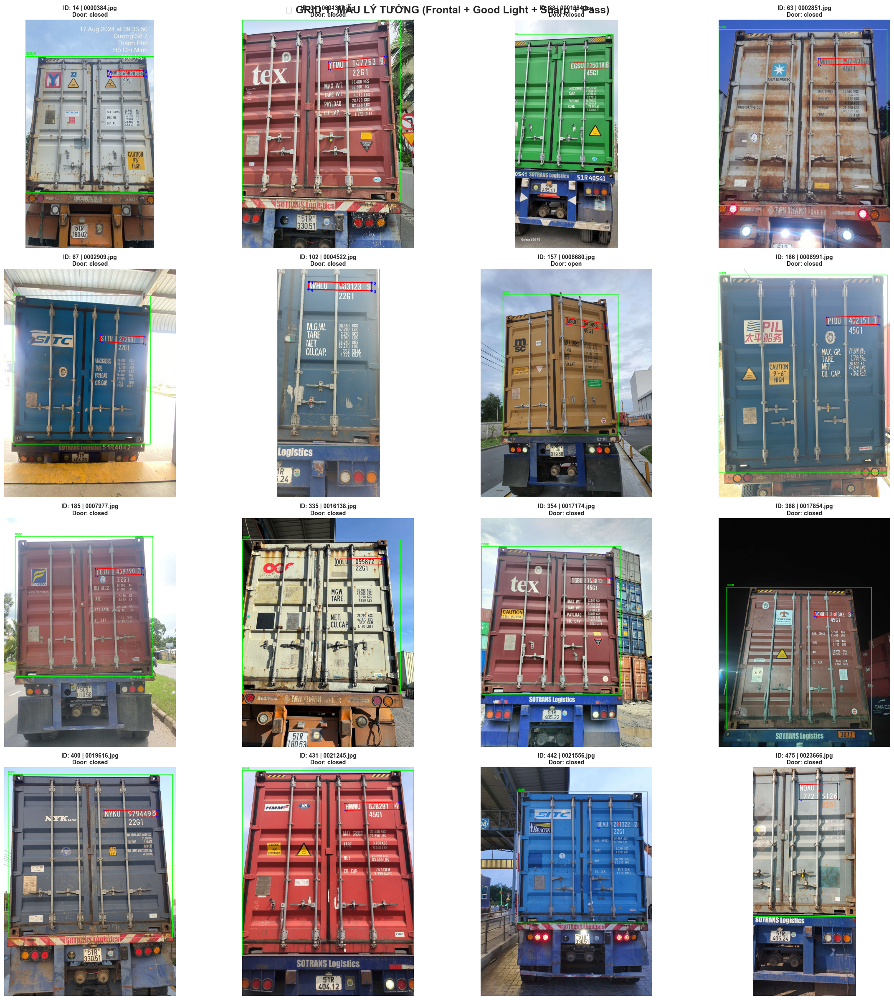

In [16]:
# Grid 1: Ideal samples
print("\n🟢 GRID 1: IDEAL SAMPLES")
print("=" * 60)

ideal_conditions = {
    "view_angle": "frontal",
    "lightning": "good_light",
    "sharpness": "sharp",
    "quality_gate": "pass",
}

ideal_image_infos, ideal_sampled = filter_and_sample_images(
    df, coco_data, ideal_conditions, n_samples=16
)

# Load and annotate images
ideal_images = []
ideal_titles = []

for img_info in ideal_image_infos:
    img = load_and_annotate_image(
        img_info, coco_data["annotations"], category_map, RAW_DATA_PATH
    )
    if img is not None:
        ideal_images.append(img)

        # Get attributes for title
        ann_data = ideal_sampled[ideal_sampled["image_id"] == img_info["id"]].iloc[0]
        title = f"ID: {img_info['id']} | {img_info['file_name']}\n"
        title += f"Door: {ann_data.get('door_state', 'N/A')}"
        ideal_titles.append(title)

print(f"✅ Loaded {len(ideal_images)} ideal images")

# Display grid
if len(ideal_images) > 0:
    fig = create_image_grid(
        ideal_images, ideal_titles, grid_size=(4, 4), figsize=(24, 24)
    )
    plt.suptitle(
        "🟢 GRID 1: MẪU LÝ TƯỞNG (Frontal + Good Light + Sharp + Pass)",
        fontsize=18,
        fontweight="bold",
        y=0.995,
    )
    plt.show()
else:
    print("⚠️  No ideal images found")

### 4.2. Grid 2: Mẫu Khó Nhằn (Challenging Samples)

Các mẫu có combo lỗi: angled + bad_light


🟡 GRID 2: CHALLENGING SAMPLES
   Filtered: 8 images match conditions {'view_angle': 'angled', 'lightning': 'bad_light'}
✅ Loaded 8 challenging images


e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128993 (\N{LARGE YELLOW CIRCLE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


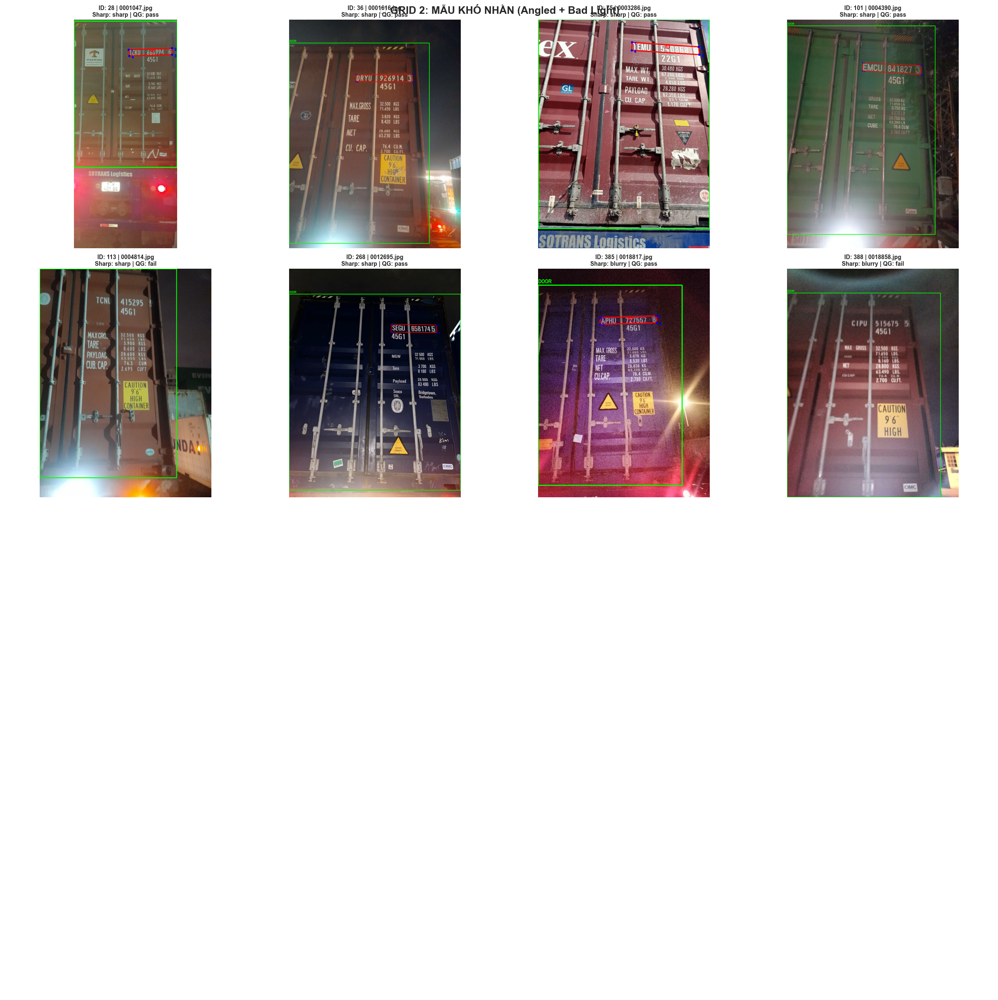

In [17]:
# Grid 2: Challenging samples (angled + bad_light)
print("\n🟡 GRID 2: CHALLENGING SAMPLES")
print("=" * 60)

challenging_conditions = {"view_angle": "angled", "lightning": "bad_light"}

challenging_image_infos, challenging_sampled = filter_and_sample_images(
    df, coco_data, challenging_conditions, n_samples=16
)

# Load and annotate images
challenging_images = []
challenging_titles = []

for img_info in challenging_image_infos:
    img = load_and_annotate_image(
        img_info, coco_data["annotations"], category_map, RAW_DATA_PATH
    )
    if img is not None:
        challenging_images.append(img)

        # Get attributes for title
        ann_data = challenging_sampled[
            challenging_sampled["image_id"] == img_info["id"]
        ].iloc[0]
        title = f"ID: {img_info['id']} | {img_info['file_name']}\n"
        title += f"Sharp: {ann_data.get('sharpness', 'N/A')} | "
        title += f"QG: {ann_data.get('quality_gate', 'N/A')}"
        challenging_titles.append(title)

print(f"✅ Loaded {len(challenging_images)} challenging images")

# Display grid
if len(challenging_images) > 0:
    fig = create_image_grid(
        challenging_images, challenging_titles, grid_size=(4, 4), figsize=(24, 24)
    )
    plt.suptitle(
        "🟡 GRID 2: MẪU KHÓ NHẰN (Angled + Bad Light)",
        fontsize=18,
        fontweight="bold",
        y=0.995,
    )
    plt.show()
else:
    print("⚠️  No challenging images found")

### 4.3. Grid 3: Mẫu Bị Loại (Failed Quality Gate)

Các mẫu có quality_gate = fail - không đủ chất lượng để sử dụng


🔴 GRID 3: FAILED QUALITY GATE
   Filtered: 13 images match conditions {'quality_gate': 'fail'}
✅ Loaded 13 failed images
✅ Loaded 13 failed images


e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


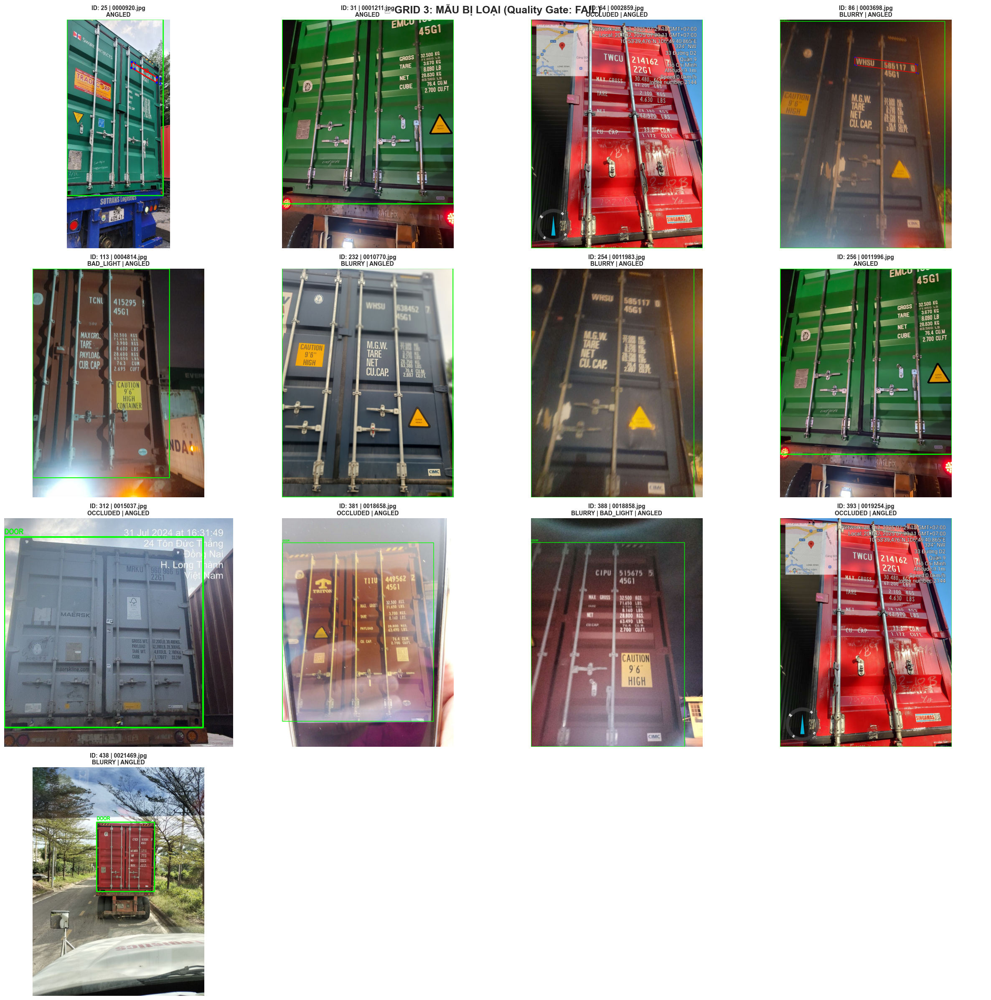

In [18]:
# Grid 3: Failed quality gate samples
print("\n🔴 GRID 3: FAILED QUALITY GATE")
print("=" * 60)

failed_conditions = {"quality_gate": "fail"}

failed_image_infos, failed_sampled = filter_and_sample_images(
    df, coco_data, failed_conditions, n_samples=16
)

# Load and annotate images
failed_images = []
failed_titles = []

for img_info in failed_image_infos:
    img = load_and_annotate_image(
        img_info, coco_data["annotations"], category_map, RAW_DATA_PATH
    )
    if img is not None:
        failed_images.append(img)

        # Get attributes for title
        ann_data = failed_sampled[failed_sampled["image_id"] == img_info["id"]].iloc[0]
        title = f"ID: {img_info['id']} | {img_info['file_name']}\n"

        # Show why it failed
        reasons = []
        if ann_data.get("sharpness") == "blurry":
            reasons.append("BLURRY")
        if ann_data.get("lightning") == "bad_light":
            reasons.append("BAD_LIGHT")
        if ann_data.get("occlusion") == "occluded":
            reasons.append("OCCLUDED")
        if ann_data.get("view_angle") == "angled":
            reasons.append("ANGLED")

        title += " | ".join(reasons) if reasons else "FAIL"
        failed_titles.append(title)

print(f"✅ Loaded {len(failed_images)} failed images")

# Display grid
if len(failed_images) > 0:
    fig = create_image_grid(
        failed_images, failed_titles, grid_size=(4, 4), figsize=(24, 24)
    )
    plt.suptitle(
        "🔴 GRID 3: MẪU BỊ LOẠI (Quality Gate: FAIL)",
        fontsize=18,
        fontweight="bold",
        y=0.995,
    )
    plt.show()
else:
    print("⚠️  No failed images found")

### 4.4. Grid 4: OCR Unreadable Samples

Các mẫu có vùng ID không thể đọc được (ocr_feasibility = unreadable)


🟠 GRID 4: OCR UNREADABLE SAMPLES
   Found 4 images with unreadable OCR
✅ Loaded 4 unreadable OCR images


e:\container-id-research\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128992 (\N{LARGE ORANGE CIRCLE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


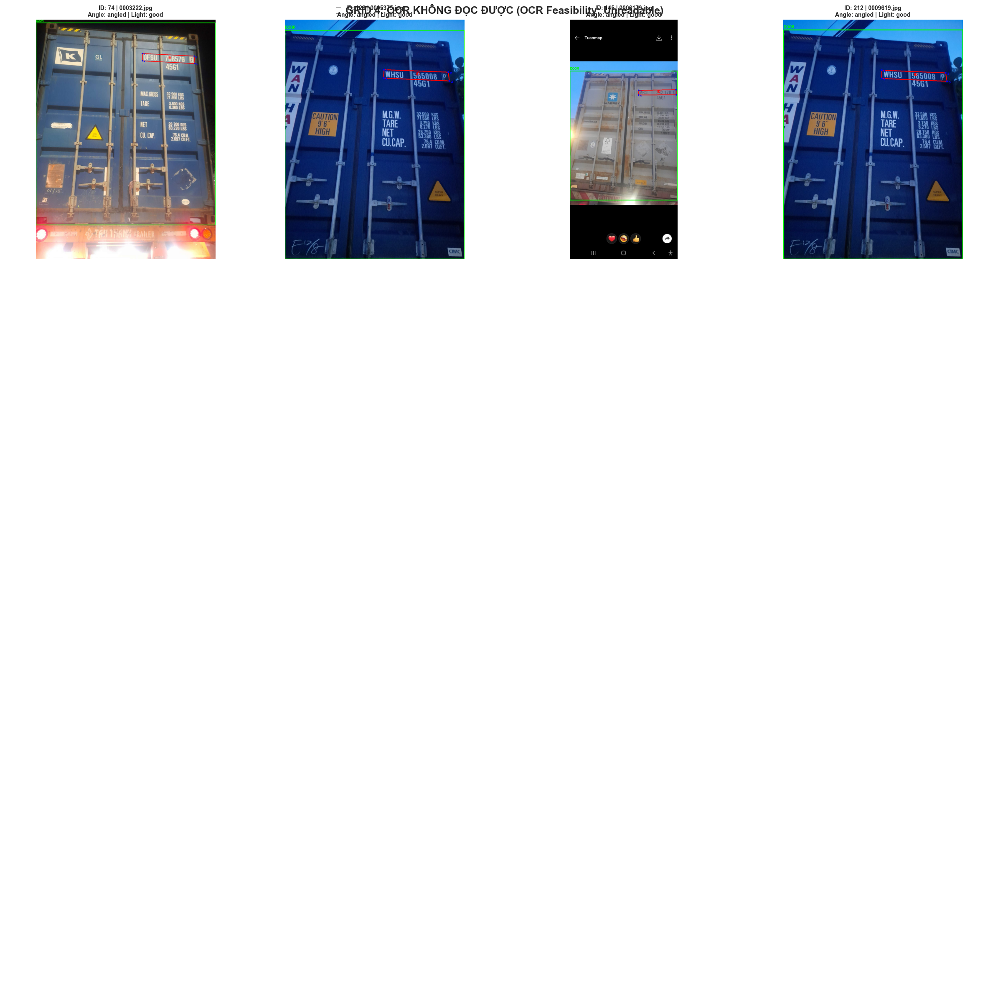

In [19]:
# Grid 4: OCR unreadable samples
# Note: ocr_feasibility is on container_id annotations, not container_door
# So we need to map back from container_id annotations to images

print("\n🟠 GRID 4: OCR UNREADABLE SAMPLES")
print("=" * 60)

# Get container_id annotations with ocr_feasibility = unreadable
id_annotations = [ann for ann in coco_data["annotations"] if ann["category_id"] == 2]
unreadable_ids = [
    ann
    for ann in id_annotations
    if ann.get("attributes", {}).get("ocr_feasibility") == "unreadable"
]

unreadable_image_ids = list(set([ann["image_id"] for ann in unreadable_ids]))
print(f"   Found {len(unreadable_image_ids)} images with unreadable OCR")

# Sample images
n_samples = min(16, len(unreadable_image_ids))
sampled_image_ids = (
    np.random.choice(unreadable_image_ids, size=n_samples, replace=False)
    if n_samples > 0
    else []
)

unreadable_image_infos = [
    img for img in coco_data["images"] if img["id"] in sampled_image_ids
]

# Load and annotate images
unreadable_images = []
unreadable_titles = []

for img_info in unreadable_image_infos:
    img = load_and_annotate_image(
        img_info, coco_data["annotations"], category_map, RAW_DATA_PATH
    )
    if img is not None:
        unreadable_images.append(img)

        # Get door attributes for this image
        door_ann = df[df["image_id"] == img_info["id"]]
        if not door_ann.empty:
            ann_data = door_ann.iloc[0]
            title = f"ID: {img_info['id']} | {img_info['file_name']}\n"
            title += f"Angle: {ann_data.get('view_angle', 'N/A')} | "
            title += f"Light: {ann_data.get('lightning', 'N/A')[:4]}"
        else:
            title = f"ID: {img_info['id']} | {img_info['file_name']}"

        unreadable_titles.append(title)

print(f"✅ Loaded {len(unreadable_images)} unreadable OCR images")

# Display grid
if len(unreadable_images) > 0:
    fig = create_image_grid(
        unreadable_images, unreadable_titles, grid_size=(4, 4), figsize=(24, 24)
    )
    plt.suptitle(
        "🟠 GRID 4: OCR KHÔNG ĐỌC ĐƯỢC (OCR Feasibility: Unreadable)",
        fontsize=18,
        fontweight="bold",
        y=0.995,
    )
    plt.show()
else:
    print("⚠️  No unreadable OCR images found")

## 5. PHÂN TÍCH TASK-SPECIFIC: OCR Feasibility

Đánh giá khả năng OCR thành công dựa trên thuộc tính `ocr_feasibility`.

📖 OCR FEASIBILITY ANALYSIS


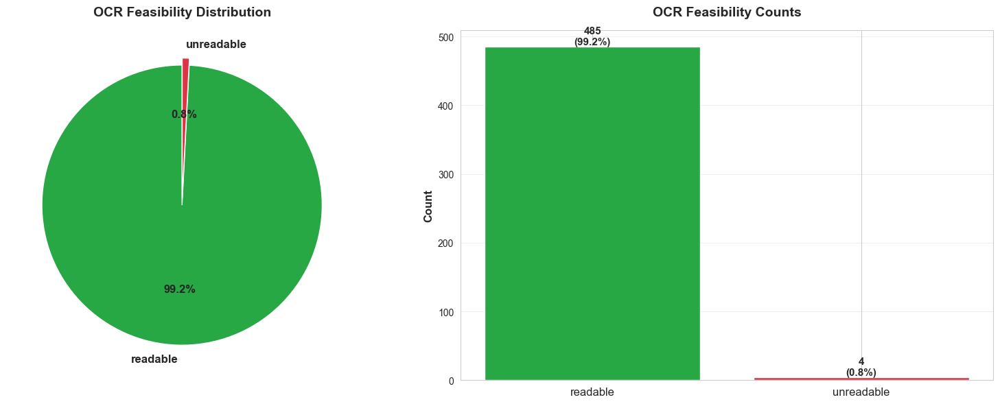


📊 Summary:
   ✅ readable: 485 (99.2%)
   ⚠️ unreadable: 4 (0.8%)

💡 Insight:
   - 0.8% of ID regions are unreadable
   - This represents the theoretical upper bound on OCR failure rate
   - Data augmentation should focus on improving these cases


In [20]:
# Analyze OCR feasibility
id_annotations_df = pd.DataFrame(
    [
        {
            "annotation_id": ann["id"],
            "image_id": ann["image_id"],
            "ocr_feasibility": ann.get("attributes", {}).get(
                "ocr_feasibility", "unknown"
            ),
        }
        for ann in coco_data["annotations"]
        if ann["category_id"] == 2
    ]
)

print("=" * 70)
print("📖 OCR FEASIBILITY ANALYSIS")
print("=" * 70)

ocr_counts = id_annotations_df["ocr_feasibility"].value_counts()
total_ids = len(id_annotations_df)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Pie chart
colors_ocr = {"readable": "#28a745", "unreadable": "#dc3545", "unknown": "#6c757d"}
pie_colors = [colors_ocr.get(label, "#6c757d") for label in ocr_counts.index]
explode = [0.05 if label == "unreadable" else 0 for label in ocr_counts.index]

axes[0].pie(
    ocr_counts.values,
    labels=ocr_counts.index,
    autopct="%1.1f%%",
    colors=pie_colors,
    explode=explode,
    startangle=90,
    textprops={"fontsize": 12, "fontweight": "bold"},
)
axes[0].set_title(
    "OCR Feasibility Distribution", fontsize=14, fontweight="bold", pad=15
)

# Bar chart with counts
bars = axes[1].bar(
    range(len(ocr_counts)),
    ocr_counts.values,
    color=[colors_ocr.get(label, "#6c757d") for label in ocr_counts.index],
)
axes[1].set_xticks(range(len(ocr_counts)))
axes[1].set_xticklabels(ocr_counts.index, fontsize=12)
axes[1].set_ylabel("Count", fontsize=12, fontweight="bold")
axes[1].set_title("OCR Feasibility Counts", fontsize=14, fontweight="bold", pad=15)
axes[1].grid(axis="y", alpha=0.3)

# Add value labels
for bar, count in zip(bars, ocr_counts.values):
    height = bar.get_height()
    axes[1].text(
        bar.get_x() + bar.get_width() / 2.0,
        height,
        f"{int(count)}\n({count/total_ids*100:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=11,
        fontweight="bold",
    )

plt.tight_layout()
plt.show()

# Print summary
print(f"\n📊 Summary:")
for label, count in ocr_counts.items():
    percentage = (count / total_ids) * 100
    status = "✅" if label == "readable" else "⚠️"
    print(f"   {status} {label}: {count} ({percentage:.1f}%)")

print("\n💡 Insight:")
if "unreadable" in ocr_counts:
    unreadable_pct = (ocr_counts["unreadable"] / total_ids) * 100
    print(f"   - {unreadable_pct:.1f}% of ID regions are unreadable")
    print(f"   - This represents the theoretical upper bound on OCR failure rate")
    print(f"   - Data augmentation should focus on improving these cases")
print("=" * 70)

## 6. TÓM TẮT VÀ KẾT LUẬN

Tổng hợp các phát hiện chính từ phân tích EDA.

In [21]:
# Generate comprehensive summary report
print("\n" + "=" * 80)
print("📋 COMPREHENSIVE EDA SUMMARY REPORT")
print("=" * 80)

print("\n1️⃣ DATASET OVERVIEW:")
print(f"   • Total Images: {n_images}")
print(f"   • Total Annotations: {n_annotations}")
print(f"   • Container Door Annotations: {len(df)}")
print(f"   • Container ID Annotations: {len(id_annotations_df)}")

print("\n2️⃣ DATA IMBALANCE HIGHLIGHTS:")
for group_name, attributes in attribute_groups.items():
    for attr in attributes:
        if attr in df.columns:
            counts = df[attr].value_counts()
            total = len(df)

            # Find most/least common
            most_common = counts.idxmax()
            most_common_pct = (counts.max() / total) * 100
            least_common = counts.idxmin()
            least_common_pct = (counts.min() / total) * 100

            imbalance_ratio = (
                counts.max() / counts.min() if counts.min() > 0 else float("inf")
            )

            if imbalance_ratio > 2:  # Only show significant imbalances
                print(f"\n   ⚠️  {attr}:")
                print(f"      • Most common: '{most_common}' ({most_common_pct:.1f}%)")
                print(
                    f"      • Least common: '{least_common}' ({least_common_pct:.1f}%)"
                )
                print(f"      • Imbalance ratio: {imbalance_ratio:.1f}x")

print("\n3️⃣ KEY FINDINGS FROM CO-OCCURRENCE ANALYSIS:")
print("   Top 5 hardest negative combinations:")
for i, (combo, count) in enumerate(combo_counts.most_common(5), 1):
    percentage = (count / len(df)) * 100
    print(f"   {i}. [{count:3d} | {percentage:5.2f}%] {combo}")

print("\n4️⃣ OCR FEASIBILITY:")
for label, count in ocr_counts.items():
    percentage = (count / len(id_annotations_df)) * 100
    print(f"   • {label}: {count} ({percentage:.1f}%)")

print("\n5️⃣ QUALITY GATE STATUS:")
if "quality_gate" in df.columns:
    qg_counts = df["quality_gate"].value_counts()
    for status, count in qg_counts.items():
        percentage = (count / len(df)) * 100
        emoji = "✅" if status == "pass" else "❌"
        print(f"   {emoji} {status}: {count} ({percentage:.1f}%)")

print("\n6️⃣ RECOMMENDATIONS FOR DATA AUGMENTATION:")
print("   Based on the analysis, consider augmenting:")

# Check imbalances
if "view_angle" in df.columns:
    angle_counts = df["view_angle"].value_counts()
    if "angled" in angle_counts and angle_counts["angled"] < len(df) * 0.3:
        print("   ⚡ Generate more 'angled' views using perspective transforms")

if "lightning" in df.columns:
    light_counts = df["lightning"].value_counts()
    if "bad_light" in light_counts and light_counts["bad_light"] < len(df) * 0.3:
        print(
            "   ⚡ Simulate 'bad_light' conditions with brightness/contrast adjustments"
        )

if "sharpness" in df.columns:
    sharp_counts = df["sharpness"].value_counts()
    if "blurry" in sharp_counts and sharp_counts["blurry"] < len(df) * 0.2:
        print("   ⚡ Add blur augmentation (Gaussian, motion blur)")

print("\n7️⃣ NEXT STEPS:")
print("   ✓ Design augmentation pipeline based on imbalance analysis")
print("   ✓ Focus on 'hardest negative' combinations for robustness testing")
print("   ✓ Use 'quality_gate=fail' samples for negative mining")
print("   ✓ Track OCR feasibility as ground truth for pipeline evaluation")

print("\n" + "=" * 80)
print("✅ EDA COMPLETE!")
print("=" * 80)


📋 COMPREHENSIVE EDA SUMMARY REPORT

1️⃣ DATASET OVERVIEW:
   • Total Images: 831
   • Total Annotations: 989
   • Container Door Annotations: 500
   • Container ID Annotations: 489

2️⃣ DATA IMBALANCE HIGHLIGHTS:

   ⚠️  view_angle:
      • Most common: 'angled' (87.4%)
      • Least common: 'frontal' (12.6%)
      • Imbalance ratio: 6.9x

   ⚠️  door_state:
      • Most common: 'closed' (92.6%)
      • Least common: 'open' (7.4%)
      • Imbalance ratio: 12.5x

   ⚠️  lightning:
      • Most common: 'good_light' (98.2%)
      • Least common: 'bad_light' (1.8%)
      • Imbalance ratio: 54.6x

   ⚠️  occlusion:
      • Most common: 'not_occluded' (94.8%)
      • Least common: 'occluded' (5.2%)
      • Imbalance ratio: 18.2x

   ⚠️  surface:
      • Most common: 'clean' (96.4%)
      • Least common: 'not_clean' (3.6%)
      • Imbalance ratio: 26.8x

   ⚠️  sharpness:
      • Most common: 'sharp' (87.6%)
      • Least common: 'blurry' (12.4%)
      • Imbalance ratio: 7.1x

   ⚠️  quality